In [1]:
import plotly.express as px
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import RobustScaler
import matplotlib
matplotlib.use('TkAgg') # Set the backend to TkAgg or try other available backends
import numpy as np
import pandas as pd
import pandas_profiling as pp
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import cross_val_score, KFold
from sklearn.preprocessing import PolynomialFeatures
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')


C:\Users\Ola\AppData\Local\Temp\ipykernel_4352\2392624907.py:8: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pp


In [2]:
df = pd.read_csv('unemployments.csv')

In [3]:
df.head(1)

,Region,Date,Frequency,Estimated Unemployment Rate (%),Estimated Employed,Estimated Labour Participation Rate (%),Region.1,longitude,latitude
0,Andhra Pradesh,31-01-2020,M,5.48,16635535,41.02,South,15.9129,79.74


In [4]:
df = df.rename(columns= {'Region': 'State','Region.1':'Region'})

df.rename(columns=lambda x: x.strip(), inplace=True)

df.drop(columns= 'Frequency',inplace= True)

In [5]:
profile_report = pp.ProfileReport(df)
profile_report.to_file("Profile_report.html")
profile_report


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Shape of your Data Set loaded: (267, 9)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    9 Predictors classified...
        2 variable(s) removed since they were ID or low-information variables
        List of variables removed: [' Estimated Employed', ' Frequency']
To fix data quality issues automatically, import FixDQ from autoviz...


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Region,object,0.000000,10,nan,nan,No issue
Date,object,0.000000,3,nan,nan,No issue
Frequency,object,0.000000,0,nan,nan,Zero-variance colum: drop before modeling process.
Estimated Unemployment Rate (%),float64,0.000000,NA,0.500000,75.850000,has 10 outliers greater than upper bound (34.62) or lower than lower bound(-13.02). Cap them or remove them.
Estimated Employed,int64,0.000000,100,117542.000000,59433759.000000,"Possible ID colum: drop before modeling process., has 9 outliers greater than upper bound (50438319.25) or lower than lower bound(-25720702.75). Cap them or remove them."
Estimated Labour Participation Rate (%),float64,0.000000,NA,16.770000,69.690000,has 29 outliers greater than upper bound (54.24) or lower than lower bound(27.08). Cap them or remove them.
Region.1,object,0.000000,1,nan,nan,No issue
longitude,float64,0.000000,NA,10.850500,33.778200,No issue
latitude,float64,0.000000,NA,71.192400,92.937600,No issue


Number of All Scatter Plots = 10


<Figure size 1000x500 with 0 Axes>

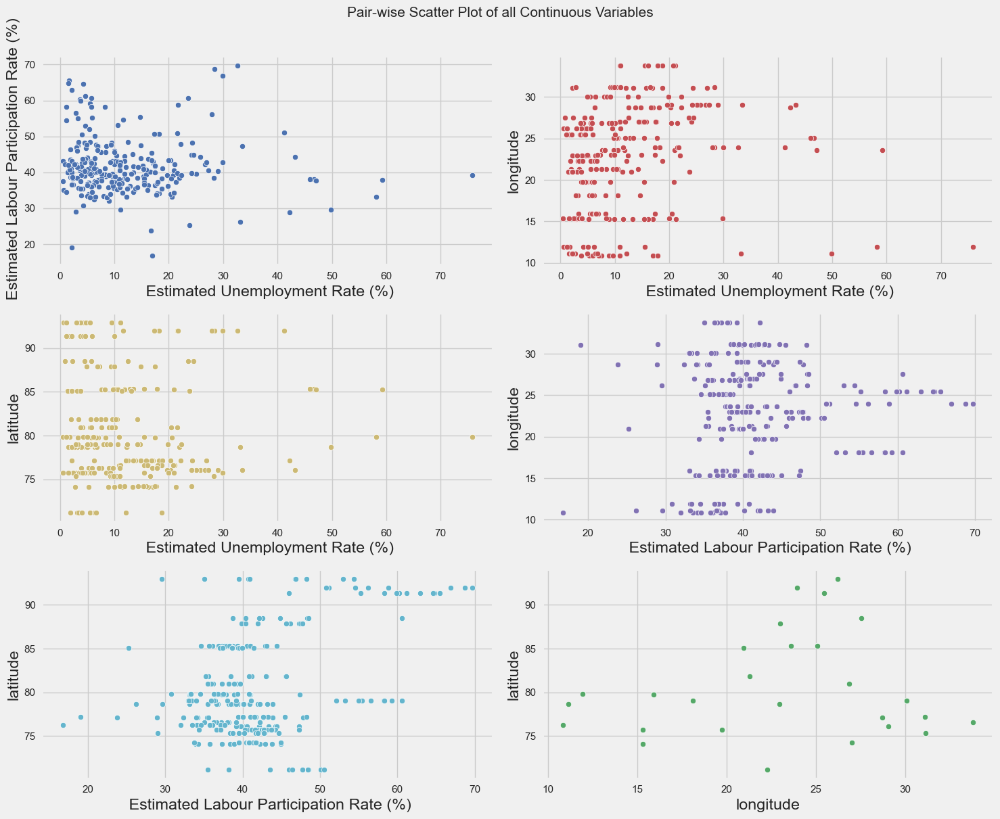

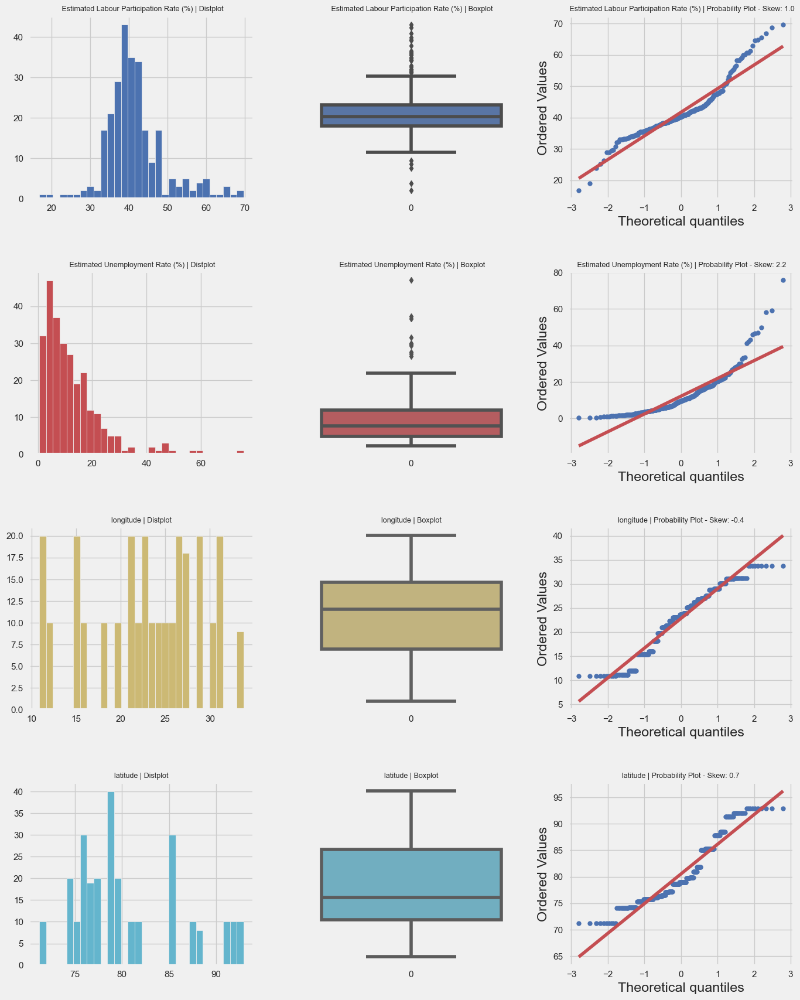

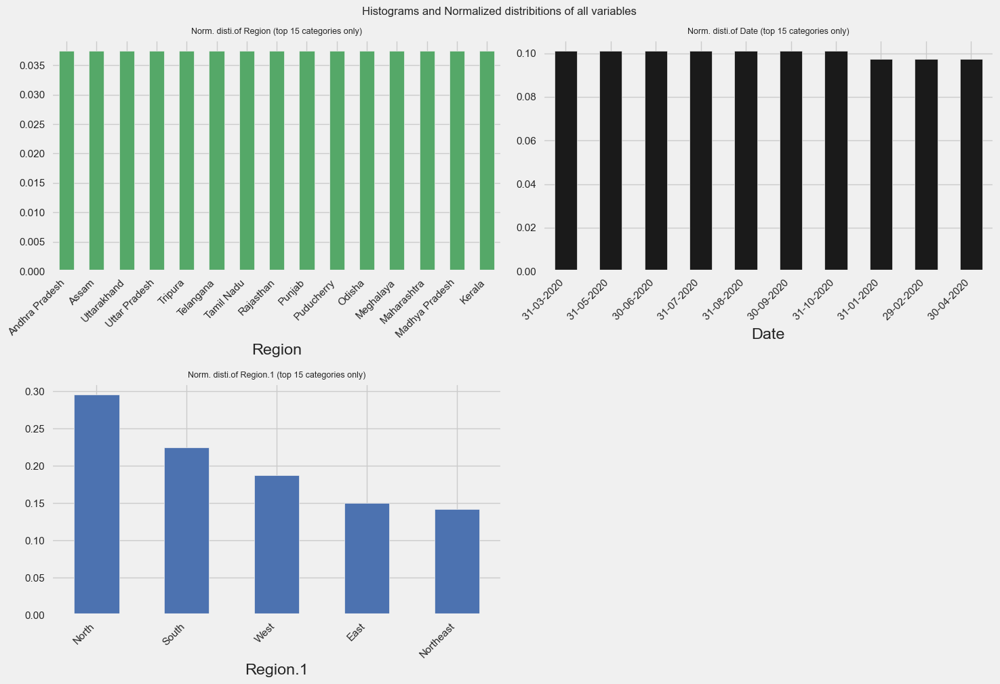

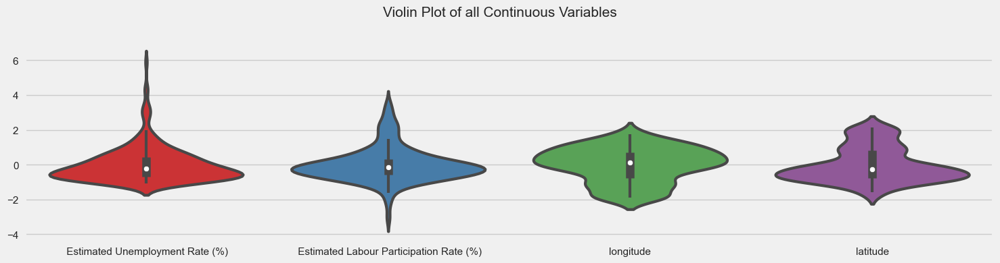

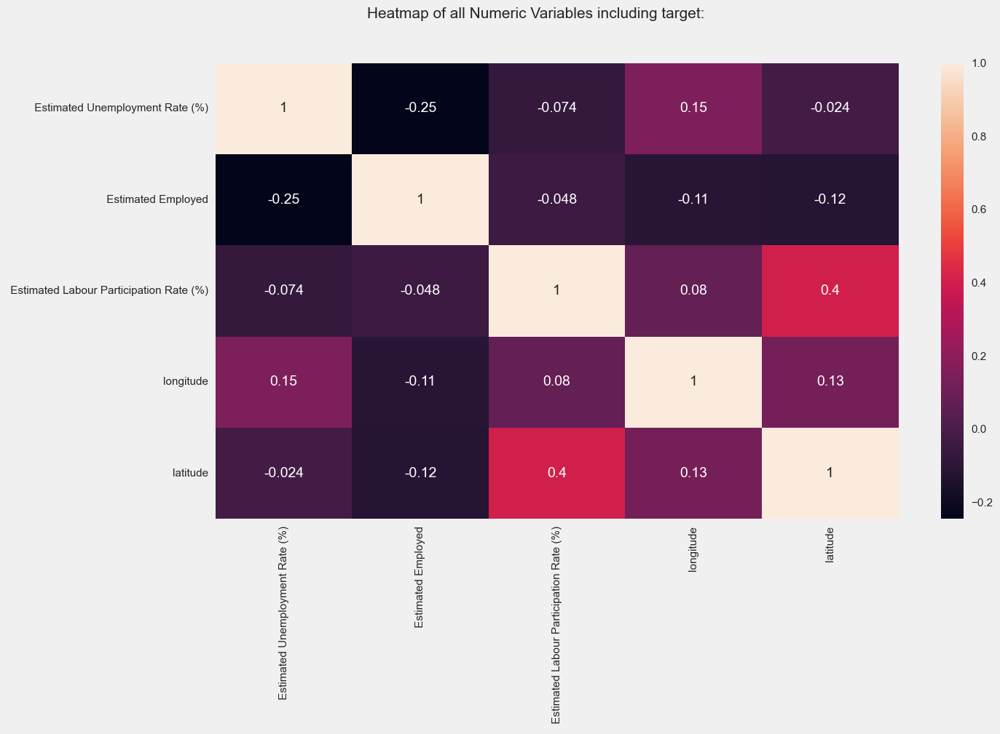

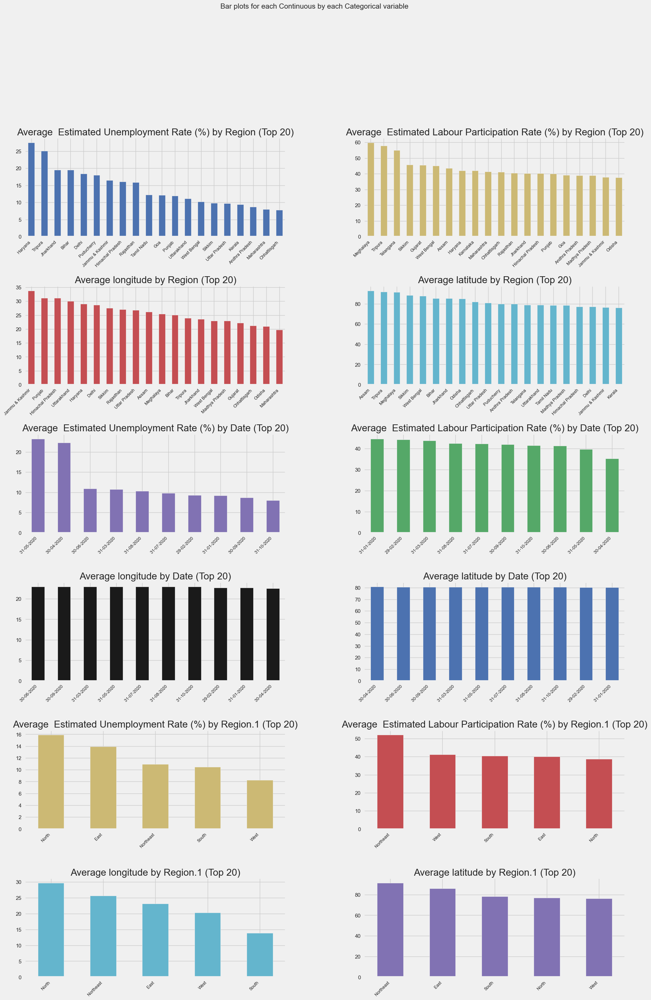

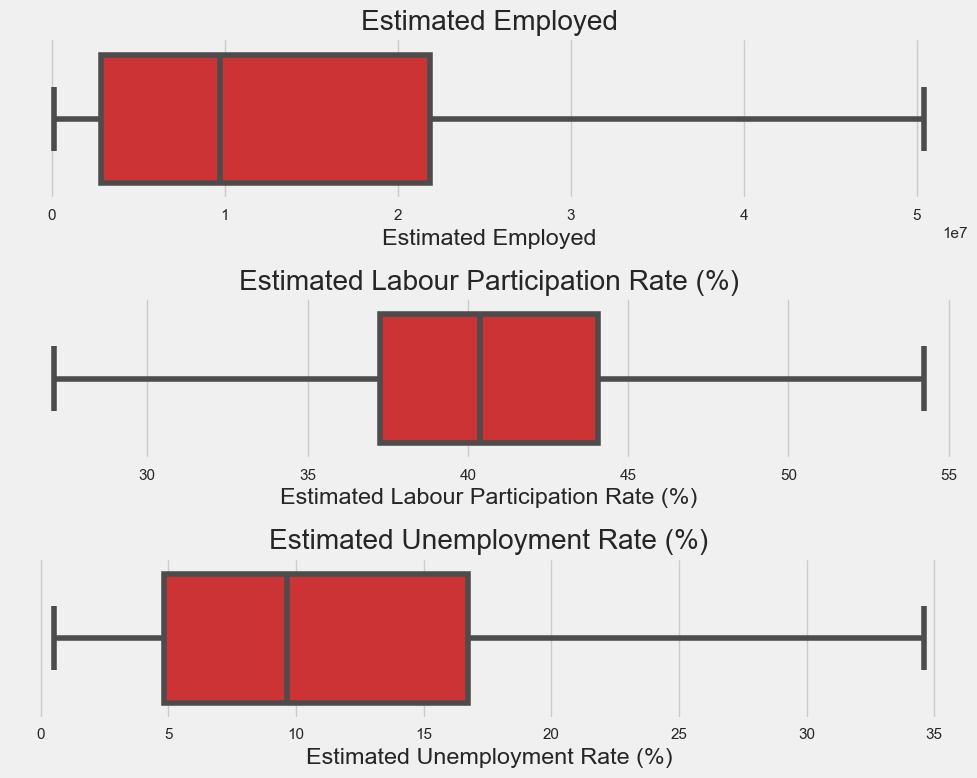

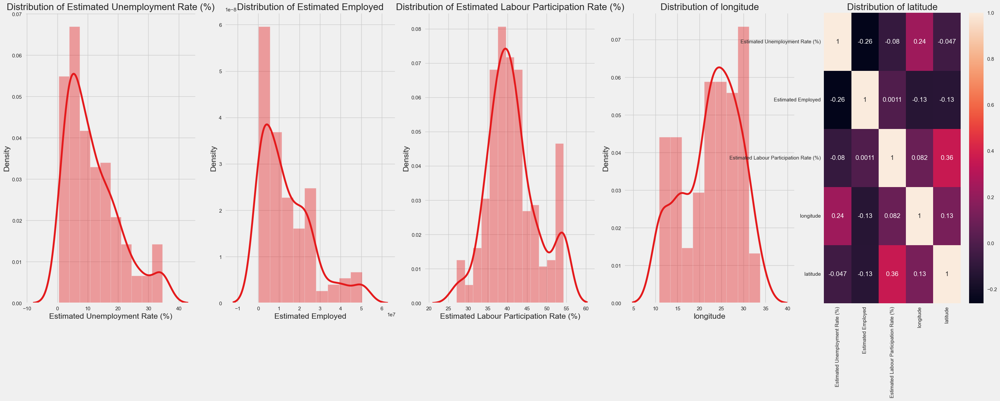

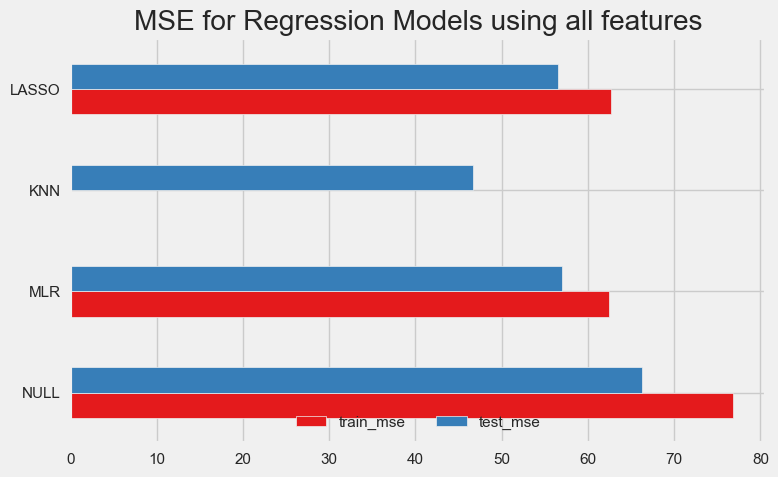

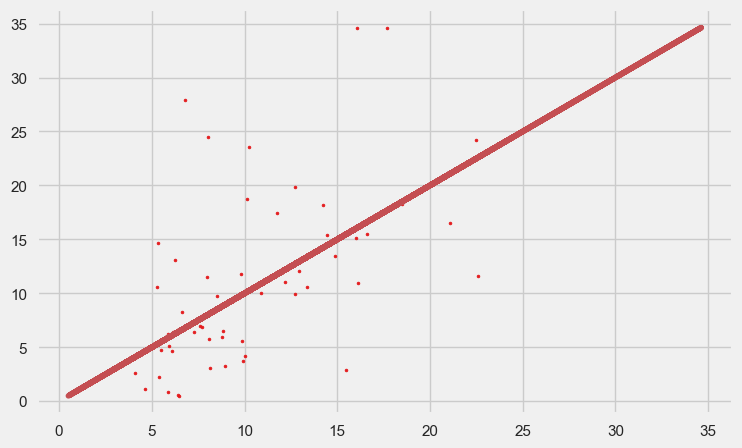

<Figure size 1000x500 with 0 Axes>

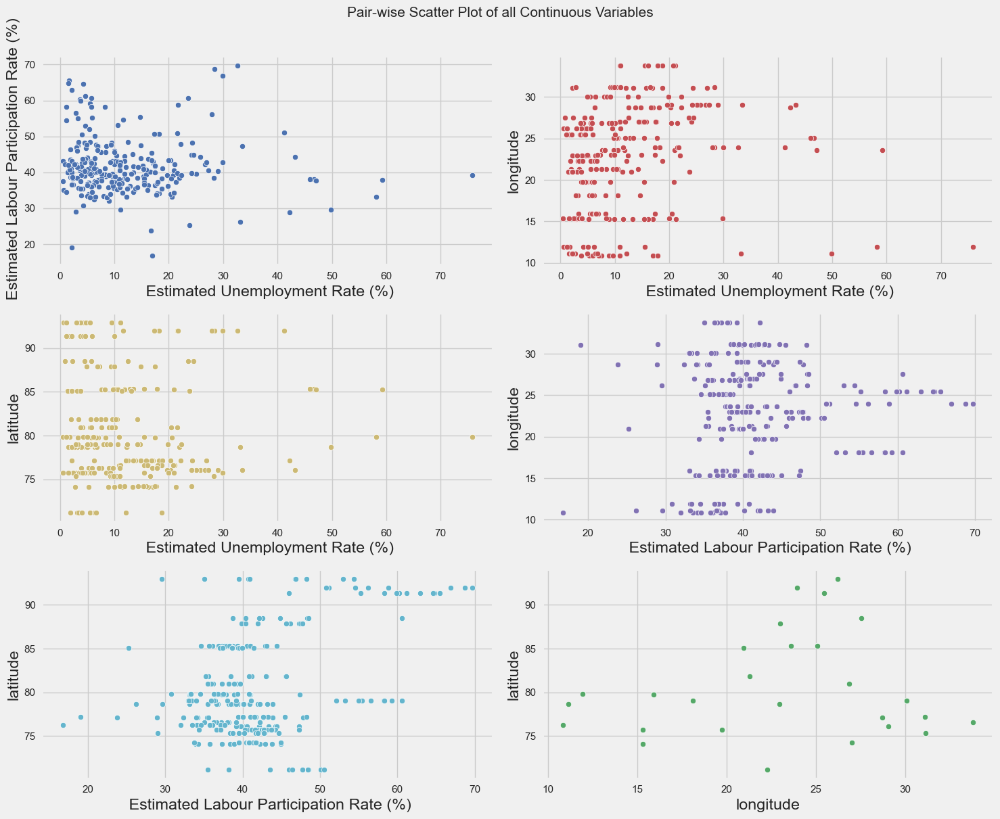

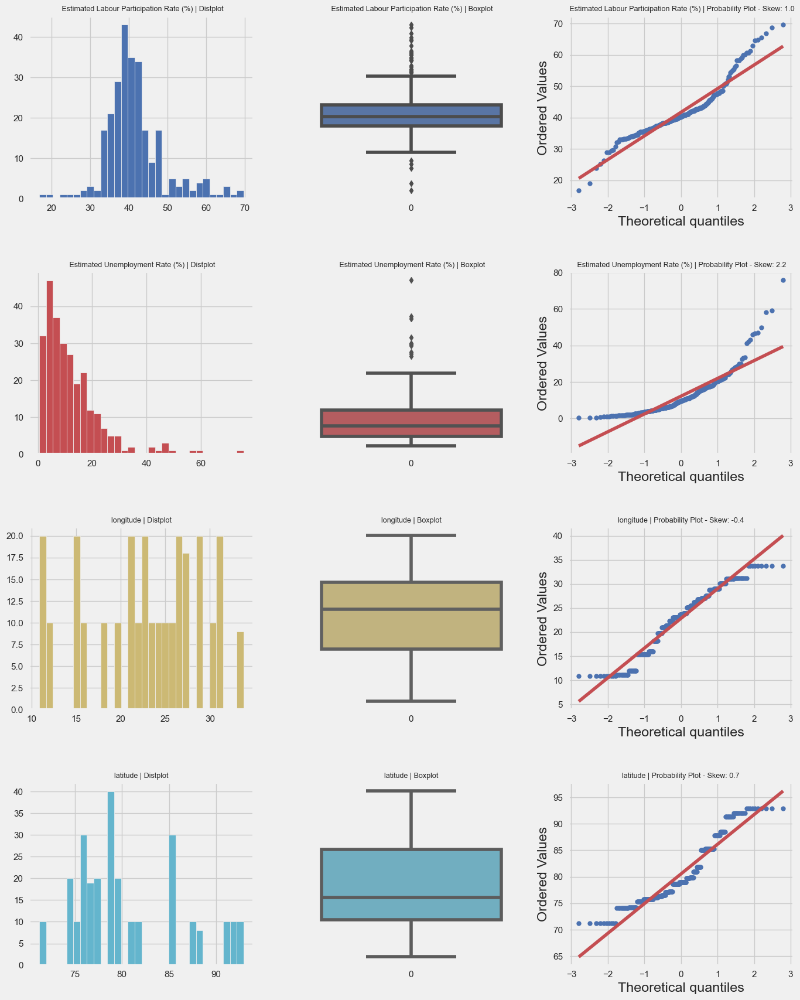

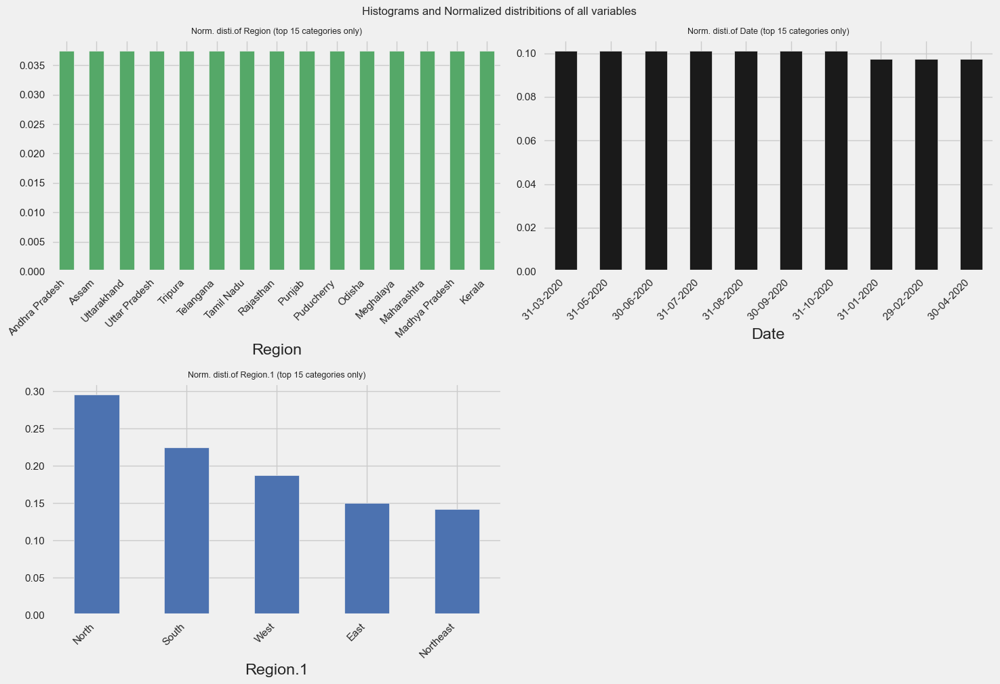

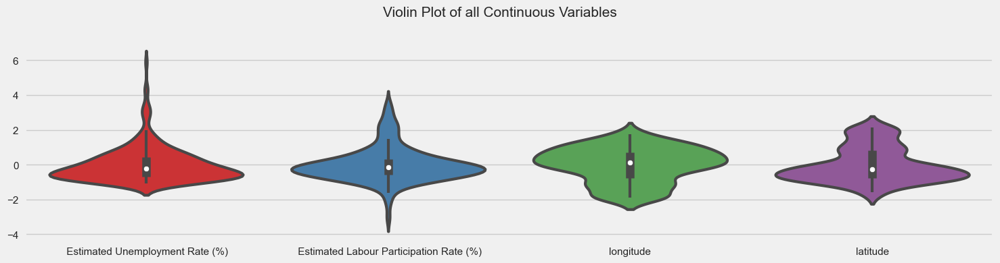

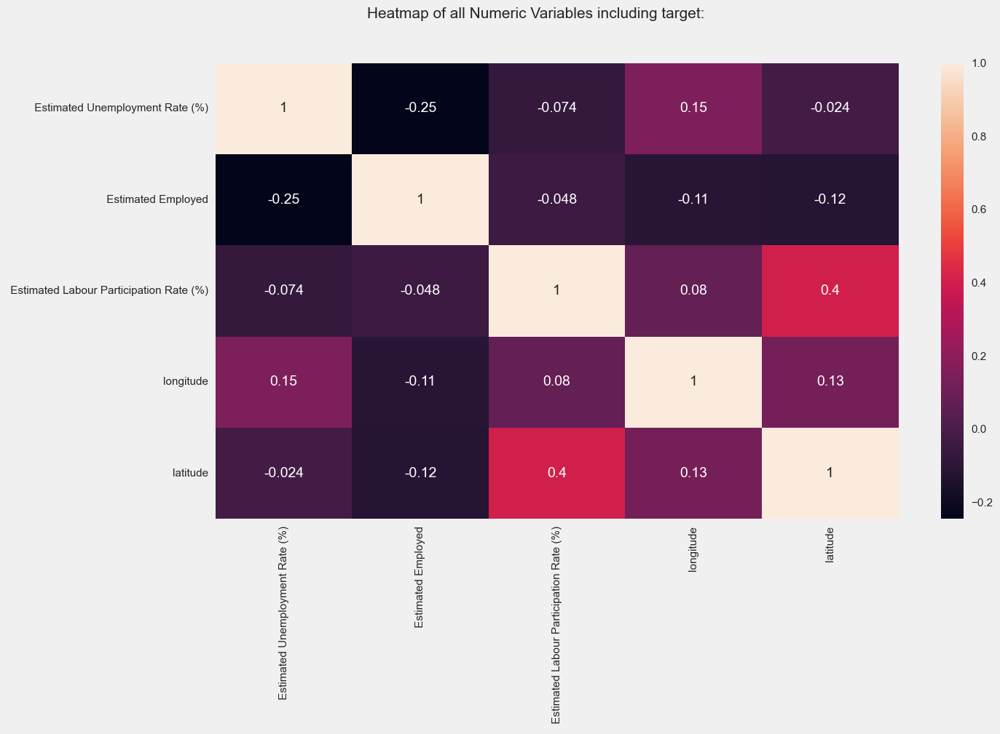

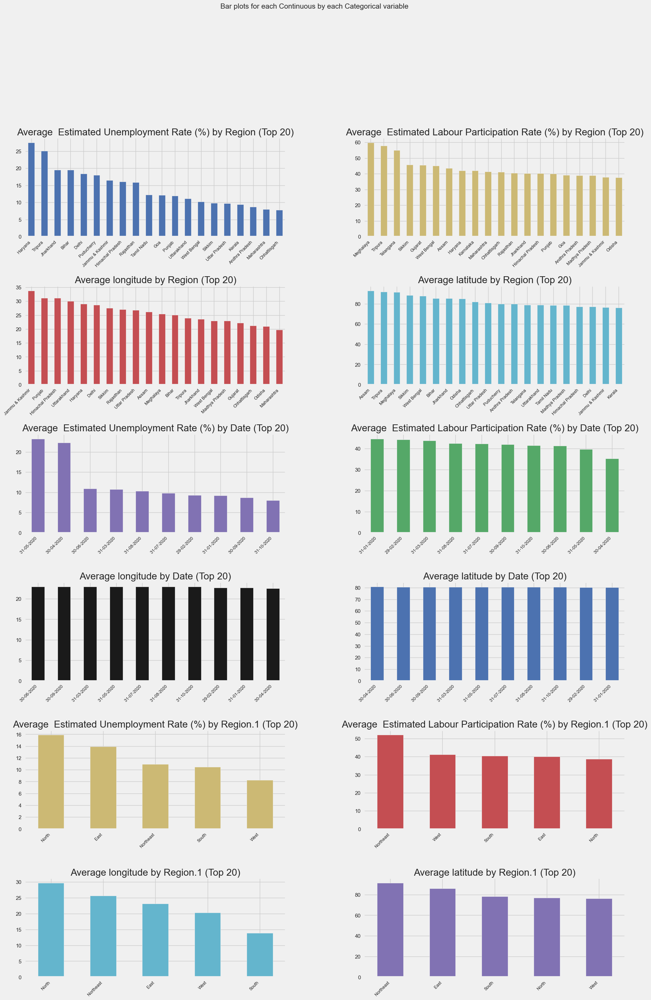

All Plots done
Time to run AutoViz = 30 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [40]:

%matplotlib inline
from autoviz.AutoViz_Class import AutoViz_Class
plt.figure(figsize=(10, 5))
AV = AutoViz_Class()
df_av = AV.AutoViz(r'C:\Users\Ola\Desktop\completed projects\unemployments.csv')
plt.show()

**After analyzing the data, a number of observations were made:**

1. Duplicate Rows: The data contained zero duplicate rows and thus key to ensuring the accuracy of data analysis


2. Correlation: Estimated employed is highly correlated with State, Longitude and Latitude are also highly correlated with the state and region


3. Outliers: The box plot analysis revealed the presence of outliers in the dataset. These outliers represent data points that significantly deviate from the majority of the data and may warrant further investigation to determine their impact on the analysis.


Considering these findings, further data preprocessing steps such as outlier treatment, should be performed to ensure the accuracy and reliability of the analysis.


**Treating outliers**

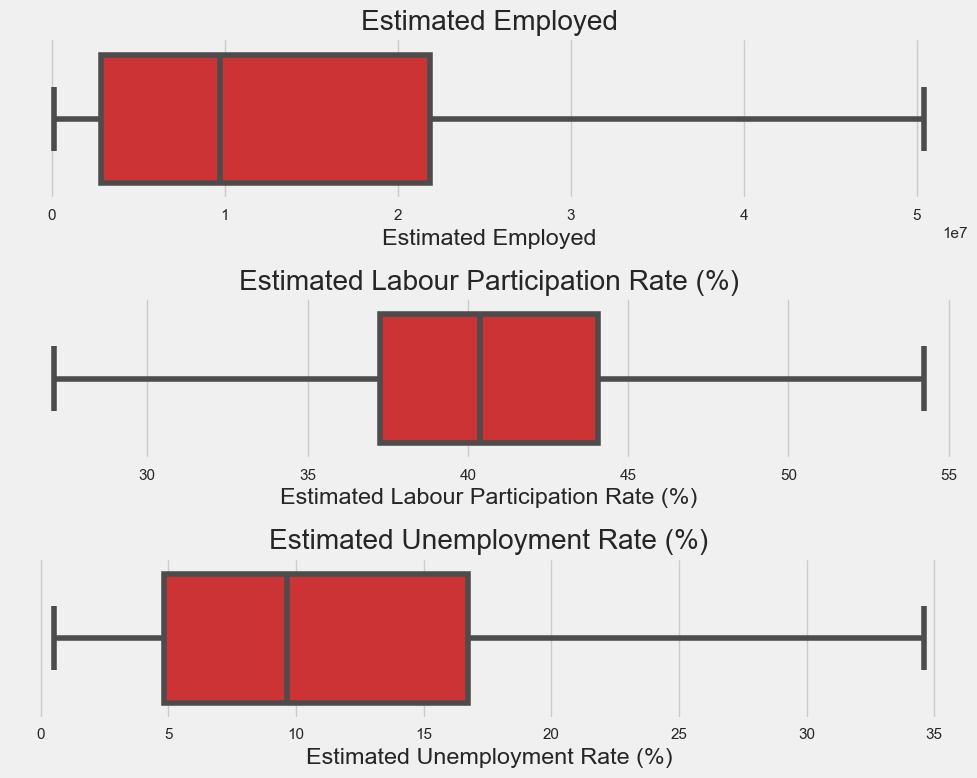

In [41]:
from feature_engine.outliers import Winsorizer

#Selecting the features to winsorize

features = ['Estimated Employed','Estimated Labour Participation Rate (%)','Estimated Unemployment Rate (%)']

#Creating the winsorizer transformation

winsorizer = Winsorizer(capping_method = 'iqr',tail= 'both',fold= 1.5,variables = features)

#Fitting and Transforming the data

df[features] = winsorizer.fit_transform(df[features])

#Visualizing the outliers

plt.figure(figsize=(10,8))

for i, feature in enumerate(features, 1):
    plt.subplot(len(features), 1, i)
    sns.boxplot(x=df[feature])
    plt.title(feature)

plt.tight_layout()
plt.show()


In [42]:
#Lets also check for outliers in each feature

features = ['Estimated Unemployment Rate (%)','Estimated Employed', 'Estimated Labour Participation Rate (%)',
           'longitude', 'latitude']

for feature in features:
    Q1 = df[feature].quantile(0.25)
    
    Q3 = df[feature].quantile(0.75)
    
    IQR = Q3 - Q1
    
    lower_fence = Q1 - 1.5 * IQR
    
    upper_fence = Q1 + 1.5 * IQR
    
    #Counting the number of outliers below the lower fence
    
    lower_outliers_count = df[df[feature] < lower_fence].shape[0]
    
    #Counting the number of outliers below the lower fence
    
    upper_outliers_count = df[df[feature] > upper_fence].shape[0]
    
    print("Feature:", feature)
    print("Number of Lower Outliers:", lower_outliers_count)
    print("Number of Upper Outliers:", upper_outliers_count)
    print("-------------------------------------------")

Feature: Estimated Unemployment Rate (%)
Number of Lower Outliers: 0
Number of Upper Outliers: 30
-------------------------------------------
Feature: Estimated Employed
Number of Lower Outliers: 0
Number of Upper Outliers: 26
-------------------------------------------
Feature: Estimated Labour Participation Rate (%)
Number of Lower Outliers: 0
Number of Upper Outliers: 44
-------------------------------------------
Feature: longitude
Number of Lower Outliers: 0
Number of Upper Outliers: 9
-------------------------------------------
Feature: latitude
Number of Lower Outliers: 0
Number of Upper Outliers: 30
-------------------------------------------


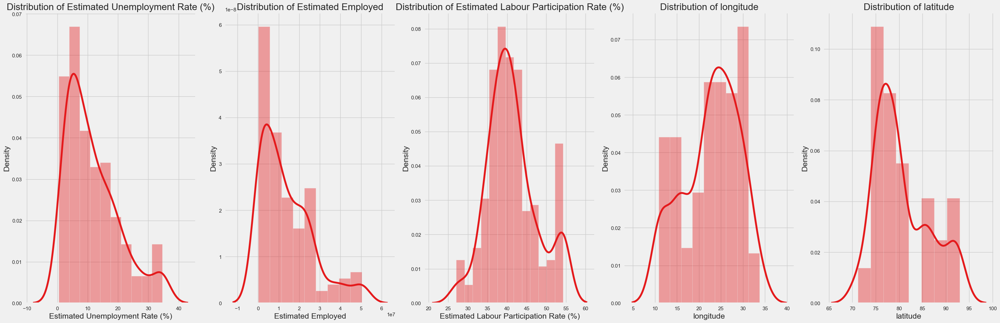

In [43]:
num_plots = len(features)

fig, axes = plt.subplots(nrows=1, ncols=num_plots, figsize=(6 * num_plots, 10))
for i, feature in enumerate(features):
    ax = axes[i]
    sns.distplot(df[feature], kde=True, ax=ax)
    ax.set_title(f"Distribution of {feature}")
    ax.set_xlabel(feature)
    ax.set_ylabel("Density")

plt.tight_layout()
plt.show()


**Observation**

Estimated Labor Participation Rate: This variable displays two Gaussians, suggesting two groupings
within the Estimated Labor Participation Rate. The distribution appears to be approximately
normal

Estimated Unemployment Rate: This variable displays two Gaussians, suggesting two groupings
within the Estimated Unemployment Rate. The distribution appears to be approximately
normal and skewed to the right indicating the increasing number of unemployment rate

Estimated Employed: The estimated employed seems to follow a nearly
normal distribution with a slight inclination towards two Gaussians, indicating a
balanced spread of this variable, it is also skewed to the right showing the increase in estimated employees

In [10]:
#Average Unemployment Rate by State

avg_unemployment_rate = df.groupby('State')['Estimated Unemployment Rate (%)'].mean().reset_index()

avg_unemployment_rate = avg_unemployment_rate.sort_values(by= 'Estimated Unemployment Rate (%)',ascending=  False)

avg_unemployment_rate = avg_unemployment_rate.reset_index(drop= True)

avg_unemployment_rate

,State,Estimated Unemployment Rate (%)
0,Haryana,26.617000
1,Tripura,24.394000
2,Delhi,17.649000
3,Bihar,17.135000
4,Jammu & Kashmir,16.477778
5,Himachal Pradesh,16.065000
6,Rajasthan,15.868000
7,Jharkhand,15.831000
8,Goa,12.167000
9,Punjab,11.981000


In [11]:
unemployment_rate_by_date = df.groupby(['State'])[['Estimated Unemployment Rate (%)','Estimated Labour Participation Rate (%)']].mean().reset_index()

unemployment_rate_by_date

,State,Estimated Unemployment Rate (%),Estimated Labour Participation Rate (%)
0,Andhra Pradesh,8.664000,38.962000
1,Assam,4.856000,43.484000
2,Bihar,17.135000,37.173000
3,Chhattisgarh,7.819000,41.161000
4,Delhi,17.649000,36.185000
5,Goa,12.167000,39.242000
6,Gujarat,6.376000,45.490000
7,Haryana,26.617000,42.100000
8,Himachal Pradesh,16.065000,41.056000
9,Jammu & Kashmir,16.477778,37.894444


In [12]:
melted_unemployment_rate = pd.melt(unemployment_rate_by_date,id_vars= 'State',var_name= 'unemployment_labor_participation',value_name= 'percentages')

melted_unemployment_rate

,State,unemployment_labor_participation,percentages
0,Andhra Pradesh,Estimated Unemployment Rate (%),8.664000
1,Assam,Estimated Unemployment Rate (%),4.856000
2,Bihar,Estimated Unemployment Rate (%),17.135000
3,Chhattisgarh,Estimated Unemployment Rate (%),7.819000
4,Delhi,Estimated Unemployment Rate (%),17.649000
5,Goa,Estimated Unemployment Rate (%),12.167000
6,Gujarat,Estimated Unemployment Rate (%),6.376000
7,Haryana,Estimated Unemployment Rate (%),26.617000
8,Himachal Pradesh,Estimated Unemployment Rate (%),16.065000
9,Jammu & Kashmir,Estimated Unemployment Rate (%),16.477778


In [13]:
fig= px.bar(melted_unemployment_rate,x='percentages',y='State',orientation= 'h',color='unemployment_labor_participation',barmode= 'group',title='Estimated Labor Participation and unemployment rate by state')

fig.update_layout(width=1000, height=800)

fig.show()

In [14]:
unemployment_rate = df.groupby(['State','Date'])[['Estimated Labour Participation Rate (%)','Estimated Unemployment Rate (%)']].mean().reset_index()

unemployment_rate

,State,Date,Estimated Labour Participation Rate (%),Estimated Unemployment Rate (%)
0,Andhra Pradesh,29-02-2020,40.90,5.83
1,Andhra Pradesh,30-04-2020,33.10,20.51
2,Andhra Pradesh,30-06-2020,47.41,3.31
3,Andhra Pradesh,30-09-2020,37.47,6.40
4,Andhra Pradesh,31-01-2020,41.02,5.48
5,Andhra Pradesh,31-03-2020,39.18,5.79
6,Andhra Pradesh,31-05-2020,36.46,17.43
7,Andhra Pradesh,31-07-2020,38.91,8.34
8,Andhra Pradesh,31-08-2020,37.83,6.96
9,Andhra Pradesh,31-10-2020,37.34,6.59


In [15]:
fig= px.line(unemployment_rate,x= 'Date',y='Estimated Unemployment Rate (%)',color= 'State',title= 'Unemployment Rate over Time By State')

fig.update_layout(width=1000, height=800)

fig.show()

In [16]:
fig= px.line(unemployment_rate,x= 'Date',y='Estimated Labour Participation Rate (%)',color= 'State',title= 'Estimated Labor Participation Rate over Time By State')

fig.update_layout(width=1000, height=800)

fig.show()

In [17]:
df

,State,Date,Estimated Unemployment Rate (%),Estimated Employed,Estimated Labour Participation Rate (%),Region,longitude,latitude
0,Andhra Pradesh,31-01-2020,5.48,16635535.00,41.02,South,15.9129,79.7400
1,Andhra Pradesh,29-02-2020,5.83,16545652.00,40.90,South,15.9129,79.7400
2,Andhra Pradesh,31-03-2020,5.79,15881197.00,39.18,South,15.9129,79.7400
3,Andhra Pradesh,30-04-2020,20.51,11336911.00,33.10,South,15.9129,79.7400
4,Andhra Pradesh,31-05-2020,17.43,12988845.00,36.46,South,15.9129,79.7400
5,Andhra Pradesh,30-06-2020,3.31,19805400.00,47.41,South,15.9129,79.7400
6,Andhra Pradesh,31-07-2020,8.34,15431615.00,38.91,South,15.9129,79.7400
7,Andhra Pradesh,31-08-2020,6.96,15251776.00,37.83,South,15.9129,79.7400
8,Andhra Pradesh,30-09-2020,6.40,15220312.00,37.47,South,15.9129,79.7400
9,Andhra Pradesh,31-10-2020,6.59,15157557.00,37.34,South,15.9129,79.7400


In [18]:
employed_persons = df.groupby(['State','Date'])['Estimated Employed'].mean().reset_index()

employed_persons

,State,Date,Estimated Employed
0,Andhra Pradesh,29-02-2020,16545652.00
1,Andhra Pradesh,30-04-2020,11336911.00
2,Andhra Pradesh,30-06-2020,19805400.00
3,Andhra Pradesh,30-09-2020,15220312.00
4,Andhra Pradesh,31-01-2020,16635535.00
5,Andhra Pradesh,31-03-2020,15881197.00
6,Andhra Pradesh,31-05-2020,12988845.00
7,Andhra Pradesh,31-07-2020,15431615.00
8,Andhra Pradesh,31-08-2020,15251776.00
9,Andhra Pradesh,31-10-2020,15157557.00


In [19]:
fig= px.line(employed_persons, x= 'Date',y= 'Estimated Employed',color= 'State',title= 'Employed Persons by Date')

fig.update_layout(height= 1000, width= 800)

fig.show()

In [20]:
correlation = df.select_dtypes(include= 'number')
sns.heatmap(correlation.corr(),annot= True)

<Axes: title={'center': 'Distribution of latitude'}>

In [21]:
unemployment = df[['State','Region','Estimated Unemployment Rate (%)','Estimated Labour Participation Rate (%)']]

fig = px.sunburst(unemployment, path=['Region', 'State'],
                 values='Estimated Unemployment Rate (%)',
                 width=700, height=700,
                 title='Sunburst showing the proportion of unemployment rate by region')

fig.show()


In [22]:
df.columns


Index(['State', 'Date', 'Estimated Unemployment Rate (%)',
       'Estimated Employed', 'Estimated Labour Participation Rate (%)',
       'Region', 'longitude', 'latitude'],
      dtype='object')

# Linear Modelling

# Exploring Linear Model Predictions Despite Non Linear Relationships

In [23]:
#Dropping the columns that arent needed

df1 = df.drop(columns= ['State', 'Date', 'longitude', 'latitude'])

df1.columns

Index(['Estimated Unemployment Rate (%)', 'Estimated Employed',
       'Estimated Labour Participation Rate (%)', 'Region'],
      dtype='object')

In [24]:
#Encoding the Regions
dummy = pd.get_dummies(df1['Region'],dtype= int)

dummy

,East,North,Northeast,South,West
0,0,0,0,1,0
1,0,0,0,1,0
2,0,0,0,1,0
3,0,0,0,1,0
4,0,0,0,1,0
5,0,0,0,1,0
6,0,0,0,1,0
7,0,0,0,1,0
8,0,0,0,1,0
9,0,0,0,1,0


In [25]:
df1 = pd.concat([df1, dummy],axis=1)

df1

,Estimated Unemployment Rate (%),Estimated Employed,Estimated Labour Participation Rate (%),Region,East,North,Northeast,South,West
0,5.48,16635535.00,41.02,South,0,0,0,1,0
1,5.83,16545652.00,40.90,South,0,0,0,1,0
2,5.79,15881197.00,39.18,South,0,0,0,1,0
3,20.51,11336911.00,33.10,South,0,0,0,1,0
4,17.43,12988845.00,36.46,South,0,0,0,1,0
5,3.31,19805400.00,47.41,South,0,0,0,1,0
6,8.34,15431615.00,38.91,South,0,0,0,1,0
7,6.96,15251776.00,37.83,South,0,0,0,1,0
8,6.40,15220312.00,37.47,South,0,0,0,1,0
9,6.59,15157557.00,37.34,South,0,0,0,1,0


In [26]:
#Dropping the Region column

df1.drop(columns= 'Region', inplace=True)

x = df1.drop(columns= 'Estimated Unemployment Rate (%)')

y= df1['Estimated Unemployment Rate (%)']

robust_scale = RobustScaler()

x= robust_scale.fit_transform(x)

x_train,x_test,y_train, y_test = train_test_split(x, y, test_size= 0.2, random_state= 0)

#Printing the shape of train and test data

print("X_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (213, 7)
y_train shape: (213,)
X_test shape: (54, 7)
y_test shape: (54,)


**Linear Models**

In [27]:
lm = LinearRegression()

lm.fit(x_train, y_train)

#Make predictions on the train and test data

linear_ypred_train = lm.predict(x_train)

linear_ypred_test = lm.predict(x_test)

#Calculating the root mean squared error and the r squared score for the test set

linear_rmse_test = mean_squared_error(y_test,linear_ypred_test,squared=False)

linear_r2_test = r2_score(y_test,linear_ypred_test)

linear_r2_train = r2_score(y_train,linear_ypred_train)

#To make sure of increased accuracy, we employ the k fold cross validation

kfold_linear = KFold(n_splits= 5,random_state=0,shuffle=True)

cv_linear= cross_val_score(lm,x, y, cv= kfold_linear, scoring= 'r2')

#Printing the results

print("Linear Regression (Train) - R^2:", linear_r2_train)
print("Linear Regression (Test) - R^2:", linear_r2_test)
print("Linear Regression (Test) - RMSE:", linear_rmse_test)
print("Linear Regression CV Score Mean (R^2):", cv_linear.mean())


Linear Regression (Train) - R^2: 0.18699438767688048
Linear Regression (Test) - R^2: 0.1312372136974963
Linear Regression (Test) - RMSE: 7.5509948053466225
Linear Regression CV Score Mean (R^2): 0.1352243762808998


In [28]:
# L1 (Lasso) Regression
lasso_model = Lasso(alpha=0.1)
lasso_model.fit(x_train, y_train)
lasso_ypred_train = lasso_model.predict(x_train)
lasso_ypred_test = lasso_model.predict(x_test)
lasso_r2_train = r2_score(y_train, lasso_ypred_train)
lasso_r2_test = r2_score(y_test, lasso_ypred_test)
lasso_coeffs = lasso_model.coef_

print("Lasso Regression (Train) - R^2:", lasso_r2_train)
print("Lasso Regression (Test) - R^2:", lasso_r2_test)
print("Lasso Coeffecients : ", lasso_coeffs)

# L2 (Ridge) Regression
ridge_model = Ridge(alpha=0.1) # Adjust alpha as needed
ridge_model.fit(x_train, y_train)
ridge_predictions_train = ridge_model.predict(x_train)
ridge_predictions_test = ridge_model.predict(x_test)
ridge_rmse_test = mean_squared_error(y_test, ridge_predictions_test, squared=False)
ridge_r2_train = r2_score(y_train, ridge_predictions_train)
ridge_r2_test = r2_score(y_test, ridge_predictions_test)
# Elastic Net Regression
elastic_model = ElasticNet(alpha=0.1, l1_ratio=0.5) # Adjust alpha and l1_ratio as
elastic_model.fit(x_train, y_train)
elastic_predictions_train = elastic_model.predict(x_train)
elastic_predictions_test = elastic_model.predict(x_test)
elastic_rmse_test = mean_squared_error(y_test, elastic_predictions_test, squared=False)
elastic_r2_train = r2_score(y_train, elastic_predictions_train)
elastic_r2_test = r2_score(y_test, elastic_predictions_test)
print("Ridge Regression (Train) - R^2:", ridge_r2_train)
print("Ridge Regression (Test) - R^2:", ridge_r2_test)
print("Ridge Regression (Test) - RMSE:", ridge_rmse_test)
print("Elastic Net Regression (Train) - R^2:", elastic_r2_train)
print("Elastic Net Regression (Test) - R^2:", elastic_r2_test)
print("Elastic Net Regression (Test) - RMSE:", elastic_rmse_test)



Lasso Regression (Train) - R^2: 0.18419393540279172
Lasso Regression (Test) - R^2: 0.13804339956122513
Lasso Coeffecients :  [-2.9291192  -0.09457523  3.5106603   6.05442629 -0.         -0.
 -0.04213463]
Ridge Regression (Train) - R^2: 0.18699363119652612
Ridge Regression (Test) - R^2: 0.13118594145056872
Ridge Regression (Test) - RMSE: 7.5512176226474015
Elastic Net Regression (Train) - R^2: 0.17845022711891556
Elastic Net Regression (Test) - R^2: 0.12325655402708657
Elastic Net Regression (Test) - RMSE: 7.585598127250066


In [29]:
#Create a dataframe to check out which model will be the best for work here
models = pd.DataFrame(index= ['train_mse','test_mse'],
                     columns= ['NULL','MLR','KNN','LASSO'])


In [30]:
y_pred_null = y_train.mean()

models.loc['train_mse','NULL'] = mean_squared_error(y_pred= np.repeat(y_pred_null,y_train.size),y_true= y_train)

models.loc['test_mse','NULL'] = mean_squared_error(y_pred= np.repeat(y_pred_null,y_test.size),y_true= y_test)

models

,NULL,MLR,KNN,LASSO
train_mse,76.839263,NaN,NaN,NaN
test_mse,66.244334,NaN,NaN,NaN


**MLR**

In [31]:
lm = LinearRegression()

lm.fit(x_train,y_train)

models.loc['train_mse','MLR'] = mean_squared_error(y_pred= lm.predict(x_train),y_true= y_train)

models.loc['test_mse','MLR'] = mean_squared_error(y_pred= lm.predict(x_test),y_true= y_test)

In [32]:
models

,NULL,MLR,KNN,LASSO
train_mse,76.839263,62.470752,NaN,NaN
test_mse,66.244334,57.017523,NaN,NaN


**KNN**

In [33]:
knn = KNeighborsRegressor(n_neighbors=10, weights= 'distance', metric= 'euclidean', n_jobs= -1)

knn.fit(x_train,y_train)

models.loc['train_mse','KNN'] = mean_squared_error(y_pred= knn.predict(x_train),y_true= y_train)

models.loc['test_mse','KNN'] = mean_squared_error(y_pred= knn.predict(x_test),y_true= y_test)

models

,NULL,MLR,KNN,LASSO
train_mse,76.839263,62.470752,0.0,NaN
test_mse,66.244334,57.017523,46.721655,NaN


**LASSO**

In [34]:
lasso= Lasso(alpha= 0.1)

lasso.fit(x_train,y_train)

models.loc['train_mse','LASSO'] = mean_squared_error(y_pred= lasso.predict(x_train),y_true= y_train)

models.loc['test_mse','LASSO'] = mean_squared_error(y_pred= lasso.predict(x_test),y_true= y_test)

models

,NULL,MLR,KNN,LASSO
train_mse,76.839263,62.470752,0.0,62.685937
test_mse,66.244334,57.017523,46.721655,56.570828


In [35]:
fig, ax = plt.subplots(figsize= (8,5))

models.T.plot(kind= 'barh',ax=ax)

ax.set_title('MSE for Regression Models using all features')

ax.legend(loc= 8, ncol= 5)

In [36]:
#KNN is the best model for the prediction of our data

fig, ax = plt.subplots(figsize= (8,5))

ax.scatter(knn.predict(x_test),y_test,s=4)

ax.plot(y_test, y_test, color= 'r')

In [37]:
knn_final = KNeighborsRegressor(n_neighbors=10, weights= 'distance', metric= 'euclidean',n_jobs= -1)

#Fit the data to the whole data set

knn_final.fit(x_train, y_train)

KNeighborsRegressor(metric='euclidean', n_jobs=-1, n_neighbors=10,
                    weights='distance')

In [38]:
knn.score(x_test,y_test)

0.28811296051331103

In [39]:
y_pred = knn_final.predict(x_test)


**The end**

**Chris Olande**